In [1]:
import numpy as np
import pandas as pd
import math


In [2]:
file_1=pd.read_excel('C:/Users/swaro/Downloads/Case_study_for_Data_Analyst_Internship/Emails sent.xlsx',engine='openpyxl')
file_1

,name_last,name_first,name_middle,mail_sent_date,office
0,ADELGLASS,JEFFREY,M.,2009-05-22 00:00:00,Center for Drug Evaluation and Research
1,ADKINSON,N.,FRANKLIN,2010-04-17,Center for Biologics Evaluation and Research
2,ALLEN,MARK,S.,2012-01-26,Center for Devices and Radiological Health
3,AMSTERDAM,DANIEL,NaN,2014.11.15,Center for Biologics Evaluation and Research
4,AMSTUTZ,HARLAN,C.,2014.07.17,Center for Devices and Radiological Health
...,...,...,...,...,...
267,YADAV,SANJAY,S.,2015-04-09,Center for Devices and Radiological Health
268,YANNEY,JAMES,NaN,2013-07-27,Center for Devices and Radiological Health
269,ZHANG,JINGWU,NaN,2009-03-23 00:00:00,Center for Biologics Evaluation and Research
270,ZIRAN,BRUCE,H.,2018-08-25,Center for Devices and Radiological Health


In [3]:
#file conversion, fome .xlsx to .csv
file_1.to_csv('file_1.csv',encoding='utf-8',index=False,header=True)
pd.read_csv('file_1.csv', sep=',',names=['name_last','name_first','name_middle','mail_sent_date','office'],skipinitialspace=True)
#file_1['name_last']

#pd.set_option('max_rows',None)
file_1['name']=file_1['name_first']+' '+file_1['name_last']
file_1

,name_last,name_first,name_middle,mail_sent_date,office,name
0,ADELGLASS,JEFFREY,M.,2009-05-22 00:00:00,Center for Drug Evaluation and Research,JEFFREY ADELGLASS
1,ADKINSON,N.,FRANKLIN,2010-04-17,Center for Biologics Evaluation and Research,N. ADKINSON
2,ALLEN,MARK,S.,2012-01-26,Center for Devices and Radiological Health,MARK ALLEN
3,AMSTERDAM,DANIEL,NaN,2014.11.15,Center for Biologics Evaluation and Research,DANIEL AMSTERDAM
4,AMSTUTZ,HARLAN,C.,2014.07.17,Center for Devices and Radiological Health,HARLAN AMSTUTZ
...,...,...,...,...,...,...
267,YADAV,SANJAY,S.,2015-04-09,Center for Devices and Radiological Health,SANJAY YADAV
268,YANNEY,JAMES,NaN,2013-07-27,Center for Devices and Radiological Health,JAMES YANNEY
269,ZHANG,JINGWU,NaN,2009-03-23 00:00:00,Center for Biologics Evaluation and Research,JINGWU ZHANG
270,ZIRAN,BRUCE,H.,2018-08-25,Center for Devices and Radiological Health,BRUCE ZIRAN


In [4]:
file_1.shape

(272, 6)

## standardizing date formate

In [67]:
file_1['mail_sent_date']=pd.to_datetime(file_1['mail_sent_date'])
file_1['year']=pd.DatetimeIndex(file_1['mail_sent_date']).year
#format=%y%m%d
file_1

,name_last,name_first,name_middle,mail_sent_date,office,name,year
0,ADELGLASS,JEFFREY,M.,2009-05-22,Center for Drug Evaluation and Research,JEFFREY ADELGLASS,2009
1,ADKINSON,N.,FRANKLIN,2010-04-17,Center for Biologics Evaluation and Research,N. ADKINSON,2010
2,ALLEN,MARK,S.,2012-01-26,Center for Devices and Radiological Health,MARK ALLEN,2012
3,AMSTERDAM,DANIEL,NaN,2014-11-15,Center for Biologics Evaluation and Research,DANIEL AMSTERDAM,2014
4,AMSTUTZ,HARLAN,C.,2014-07-17,Center for Devices and Radiological Health,HARLAN AMSTUTZ,2014
5,ANDERSON,C.,JOSEPH,2010-02-22,Center for Devices and Radiological Health,C. ANDERSON,2010
6,ANDREWS,DAVID,W.,2010-07-17,Center for Biologics Evaluation and Research,DAVID ANDREWS,2010
7,AQEL,RAED,NaN,2012-10-27,Center for Devices and Radiological Health,RAED AQEL,2012
8,ARROWSMITH,PETER,N.,2014-01-18,Center for Devices and Radiological Health,PETER ARROWSMITH,2014
9,BARR,JOHN,D.,2010-01-11,Center for Devices and Radiological Health,JOHN BARR,2010


## Year in which maximum number of emails were sent to doctors

In [6]:
Max_year=dict(file_1['year'].value_counts())
print(Max_year)

{2014: 32, 2015: 31, 2019: 25, 2016: 25, 2010: 25, 2018: 23, 2013: 21, 2011: 20, 2012: 16, 2007: 15, 2009: 14, 2017: 11, 2008: 8, 2020: 5, 2006: 1}


In [7]:
max_key=max(Max_year,key=Max_year.get)
max_count= Max_year[max_key]
print("maximum mail sent in the year {0}, and the number of emails sent is: {1}".format(max_key,max_count))

maximum mail sent in the year 2014, and the number of emails sent is: 32


In [8]:
# another file loading
file_2=pd.DataFrame(pd.read_excel('C:/Users/swaro/Downloads/Case_study_for_Data_Analyst_Internship/fine_paid.xlsx',engine='openpyxl'))


pd.set_option('max_rows',None)
file_2

,org_indiv,first_name,last_name,city,state,category,cash_fine,online_fine,total
0,3-D MEDICAL SERVICES LLC,STEVEN,DEITELZWEIG,NEW ORLEANS,LA,Professional Advising,2625,0,2625
1,"AA DOCTORS, INC.",AAKASH,AHUJA,PASO ROBLES,CA,Expert-Led Forums,1000,0,1000
2,"ABBO, LILIAN MARGARITA",LILIAN,ABBO,MIAMI,FL,Business Related Travel,0,448,448
3,"ABBO, LILIAN MARGARITA",LILIAN,ABBO,MIAMI,FL,Meals,0,119,119
4,"ABBO, LILIAN MARGARITA",LILIAN,ABBO,MIAMI,FL,Professional Advising,1800,0,1800
5,ABDULLAH RAFFEE MD PC,ABDULLAH,RAFFEE,FLINT,MI,Expert-Led Forums,750,0,750
6,"ABEBE, SHEILA Y",SHEILA,ABEBE,INDIANAPOLIS,IN,Educational Items,0,47,47
7,"ABEBE, SHEILA Y",SHEILA,ABEBE,INDIANAPOLIS,IN,Expert-Led Forums,825,0,825
8,ABILENE FAMILY FOOT CENTER,GALEN,ALBRITTON,ABILENE,TX,Professional Advising,3000,0,3000
9,"ABOLNIK, IGOR Z",IGOR,ABOLNIK,PROVO,UT,Business Related Travel,0,396,396


In [9]:
file_2=pd.DataFrame(pd.read_csv('file_2.csv',sep=','))

In [10]:
file_2['name']=file_2['first_name']+' '+file_2['last_name']

In [11]:
file_2

,org_indiv,first_name,last_name,city,state,category,cash_fine,online_fine,total,name
0,3-D MEDICAL SERVICES LLC,STEVEN,DEITELZWEIG,NEW ORLEANS,LA,Professional Advising,2625,0,2625,STEVEN DEITELZWEIG
1,"AA DOCTORS, INC.",AAKASH,AHUJA,PASO ROBLES,CA,Expert-Led Forums,1000,0,1000,AAKASH AHUJA
2,"ABBO, LILIAN MARGARITA",LILIAN,ABBO,MIAMI,FL,Business Related Travel,0,448,448,LILIAN ABBO
3,"ABBO, LILIAN MARGARITA",LILIAN,ABBO,MIAMI,FL,Meals,0,119,119,LILIAN ABBO
4,"ABBO, LILIAN MARGARITA",LILIAN,ABBO,MIAMI,FL,Professional Advising,1800,0,1800,LILIAN ABBO
5,ABDULLAH RAFFEE MD PC,ABDULLAH,RAFFEE,FLINT,MI,Expert-Led Forums,750,0,750,ABDULLAH RAFFEE
6,"ABEBE, SHEILA Y",SHEILA,ABEBE,INDIANAPOLIS,IN,Educational Items,0,47,47,SHEILA ABEBE
7,"ABEBE, SHEILA Y",SHEILA,ABEBE,INDIANAPOLIS,IN,Expert-Led Forums,825,0,825,SHEILA ABEBE
8,ABILENE FAMILY FOOT CENTER,GALEN,ALBRITTON,ABILENE,TX,Professional Advising,3000,0,3000,GALEN ALBRITTON
9,"ABOLNIK, IGOR Z",IGOR,ABOLNIK,PROVO,UT,Business Related Travel,0,396,396,IGOR ABOLNIK


In [12]:
ofc_line=dict(file_2['org_indiv'].value_counts())
ofc_line

{'REGENTS OF THE UNIVERSITY OF CALIFORNIA': 10,
 'ANOOSHIAN, JOHN VARTAN': 5,
 'TABLANG-JIMENEZ, MARILOU G': 5,
 'SHORE, MATTHEW JON': 5,
 'RAVAL, KAUSHIK J': 5,
 'KELLOGG, JASON PAUL': 5,
 'LIONBERGER, DAVID R': 5,
 'SPIEGEL, DAVID RICHARD': 5,
 'ROMEO, FREDDIE P': 5,
 'UNIVERSITY OF TEXAS MD ANDERSON CANCER CENTER': 5,
 'COHEN, SETH ALEXANDER': 5,
 'GROW, CHELSEA RENEE': 5,
 'MILLER, BRADLEY SCOTT': 4,
 'REIMHERR, JOHN PHILIP': 4,
 'CENTORRINO, FRANCA': 4,
 'OKUDA, DARIN TAKEO': 4,
 'ELLIS, THOMAS JOS': 4,
 'SWIFT, STEVEN EDWARD': 4,
 'SOLITAR, BRUCE MICHAEL': 4,
 'BARANOWSKI, KAREN MARY': 4,
 'DUKE UNIVERSITY MEDICAL CENTER': 4,
 'BATEMAN, LUCINDA': 4,
 'HARRINGTON, LEIGH ERIN': 4,
 'TUCKER, TARVEZ': 4,
 'NELSON, CHARON KAY S': 4,
 'BERNHAGEN, MONTE LOWELL': 4,
 'SEEGER, GREGORY LAWLER': 4,
 'BROWN, PATRICK CLAYTON': 4,
 'DUSHAY, KEVIN MAIER': 4,
 'STASKIN, DAVID ROY': 4,
 'GURALNICK, MICHAEL LOUIS': 4,
 'SAGEMAN, SHARON L': 4,
 'NASRAWAY, STANLEY ANTHONY': 4,
 'BREEDING, VAN STANLE

In [13]:
dict_keys=ofc_line.keys()
dict_keys

dict_keys(['REGENTS OF THE UNIVERSITY OF CALIFORNIA', 'ANOOSHIAN, JOHN VARTAN', 'TABLANG-JIMENEZ, MARILOU G', 'SHORE, MATTHEW JON', 'RAVAL, KAUSHIK J', 'KELLOGG, JASON PAUL', 'LIONBERGER, DAVID R', 'SPIEGEL, DAVID RICHARD', 'ROMEO, FREDDIE P', 'UNIVERSITY OF TEXAS MD ANDERSON CANCER CENTER', 'COHEN, SETH ALEXANDER', 'GROW, CHELSEA RENEE', 'MILLER, BRADLEY SCOTT', 'REIMHERR, JOHN PHILIP', 'CENTORRINO, FRANCA', 'OKUDA, DARIN TAKEO', 'ELLIS, THOMAS JOS', 'SWIFT, STEVEN EDWARD', 'SOLITAR, BRUCE MICHAEL', 'BARANOWSKI, KAREN MARY', 'DUKE UNIVERSITY MEDICAL CENTER', 'BATEMAN, LUCINDA', 'HARRINGTON, LEIGH ERIN', 'TUCKER, TARVEZ', 'NELSON, CHARON KAY S', 'BERNHAGEN, MONTE LOWELL', 'SEEGER, GREGORY LAWLER', 'BROWN, PATRICK CLAYTON', 'DUSHAY, KEVIN MAIER', 'STASKIN, DAVID ROY', 'GURALNICK, MICHAEL LOUIS', 'SAGEMAN, SHARON L', 'NASRAWAY, STANLEY ANTHONY', 'BREEDING, VAN STANLEY', 'MEYER, DAVID DAVIS', 'BANSIL, RAKESH KUMAR', 'KLEMP, JENNIFER R', 'RANJAN, RAKESH', 'DERGHAM, BACHAR', 'MATTHEWS-FERRA

## Write a query to get total fine paid per Office 

In [14]:
summerized={'office':[],'sum':[]}
for i in dict_keys:
    fltr=(file_2['org_indiv']==i)
    total_list=list(file_2.loc[fltr,'total'])
    np.array([total_list])
    total_sum=np.sum(total_list)
    #filtered=print("{0}:total:{1}".format(i,total_sum))
    summerized['office'].append(i)
    summerized['sum'].append(total_sum)
      
    
df=pd.DataFrame(summerized)              
df=df.sort_values('sum',ascending=False)  

In [15]:
df.reset_index(drop=True,inplace=True)


,office,sum
0,MRA CLINICAL RESEARCH,1185466
1,DUKE UNIVERSITY MEDICAL CENTER,1024598
2,UNIVERSITY OF TEXAS MD ANDERSON CANCER CENTER,761364
3,REGENTS OF THE UNIVERSITY OF CALIFORNIA,719242
4,UNIVERSITY OF PITTSBURGH PHYSICIANS,672263
5,DANA-FARBER/PARTNERS CANCER CARE INC,622986
6,UNIVERSITY OF PITTSBURGH,437873
7,UNIVERSITY OF ALABAMA AT BIRMINGHAM,386161
8,TRUSTEES OF THE UNIVERSITY OF PENNSYLVANIA,317841
9,THE CHILDREN'S HOSPITAL,282565


## To get the highest total fine and lowest total fine paid per state

In [16]:
state_val=dict(file_2['state'].value_counts())
state_val

{'CA': 1172,
 'NY': 833,
 'FL': 738,
 'TX': 624,
 'PA': 533,
 'OH': 462,
 'IL': 448,
 'NJ': 384,
 'NC': 383,
 'MI': 342,
 'TN': 281,
 'MA': 259,
 'GA': 248,
 'MO': 237,
 'MD': 196,
 'IN': 196,
 'VA': 177,
 'WI': 169,
 'CT': 155,
 'AZ': 154,
 'SC': 149,
 'CO': 148,
 'LA': 145,
 'AL': 132,
 'KY': 128,
 'MN': 124,
 'WA': 116,
 'KS': 99,
 'PR': 88,
 'UT': 84,
 'OK': 82,
 'AR': 77,
 'MS': 76,
 'WV': 71,
 'IA': 63,
 'RI': 59,
 'DC': 59,
 'OR': 58,
 'NV': 56,
 'NE': 46,
 'DE': 35,
 'HI': 29,
 'NH': 27,
 'WY': 25,
 'NM': 25,
 'SD': 23,
 'ID': 22,
 'ME': 20,
 'ND': 10,
 'VT': 10,
 'MT': 9,
 'AK': 1}

In [17]:
state_key=state_val.keys()
state_key

dict_keys(['CA', 'NY', 'FL', 'TX', 'PA', 'OH', 'IL', 'NJ', 'NC', 'MI', 'TN', 'MA', 'GA', 'MO', 'MD', 'IN', 'VA', 'WI', 'CT', 'AZ', 'SC', 'CO', 'LA', 'AL', 'KY', 'MN', 'WA', 'KS', 'PR', 'UT', 'OK', 'AR', 'MS', 'WV', 'IA', 'RI', 'DC', 'OR', 'NV', 'NE', 'DE', 'HI', 'NH', 'WY', 'NM', 'SD', 'ID', 'ME', 'ND', 'VT', 'MT', 'AK'])

###  last case: finding 5 largest avg fine paid state and category

In [49]:
category=dict(file_2['category'].value_counts())
print(category)
cat_key=list(category.keys())
cat_key.pop(7)
cat_key

{'Meals': 3098, 'Expert-Led Forums': 2855, 'Business Related Travel': 2152, 'Professional Advising': 1524, 'Educational Items': 171, 'Infosys Sponsored Research initiated on or after July 1, 2009': 44, 'Investigator-Initiated Research': 34, 0: 3}


['Meals',
 'Expert-Led Forums',
 'Business Related Travel',
 'Professional Advising',
 'Educational Items',
 'Infosys Sponsored Research initiated on or after July 1, 2009',
 'Investigator-Initiated Research']

In [78]:
avg={'category':[],'average':[]}
def Cat_Avg(cat,x):
    cat_avg=sum(x)/len(x)
    cat_avg=round(cat_avg,1)
    avg['category'].append(cat)
    avg['average'].append(cat_avg)

      
    
    
    
    
for j in cat_key:
    cat_fltr=file_2['category']==j
    cat_list=list(file_2.loc[cat_fltr,'total'])
    Cat_Avg(j,cat_list)

cat_df=pd.DataFrame(avg).sort_values(by='average',ascending=False)
cat_top_five=cat_df.head(5)
print("\n Five average largest fine paid categories")
cat_top_five


 Five average largest fine paid categories


,category,average
5,Infosys Sponsored Research initiated on or aft...,65838.9
6,Investigator-Initiated Research,42407.5
3,Professional Advising,4965.4
1,Expert-Led Forums,3374.8
2,Business Related Travel,787.8


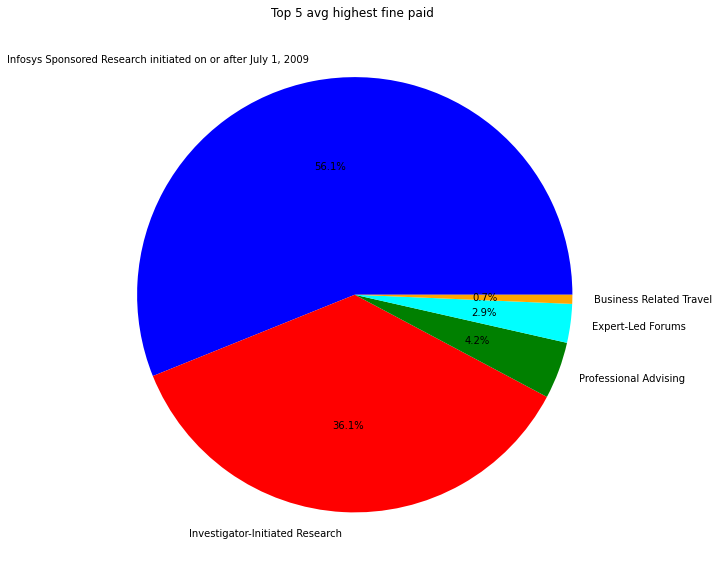

In [118]:
from matplotlib import style
import matplotlib.pyplot as plt
#print(plt.style.available)
#plt.style.use("`seaborn-pastel")
fig1,ax1=plt.subplots(figsize=(10,12))
L1 = list(cat_top_five['category'])
L2 = list(cat_top_five['average'])
color=['blue','red','green','cyan','orange']
ax1.pie(L2,labels=L1,colors=color,autopct='%1.1f%%')
plt.title("Top 5 avg highest fine paid ")
plt.tight_layout()
plt.show()


In [64]:
avg_fine={'state':[],'avg_paid':[]}
def Avg_fine(state,x):
    avg=sum(x)/len(x)
    avg=round(avg,1)
    avg_fine['state'].append(state)
    avg_fine['avg_paid'].append(avg)





state_summary={'state':[],'st_total':[],'max_fine':[],'min_fine':[]}
for i in state_key:
    st_fltr=file_2['state']==i
    st_list=list(file_2.loc[st_fltr,'total'])
             
    st_arr=np.array(st_list)
    max_st=np.max(st_arr)
    min_st=np.min(st_arr)
    st_sum=np.sum(st_arr)
    Avg_fine(i,st_list)
    #print("state:{0},total_fine:{1}".format(i,st_sum))
    state_summary['state'].append(i)
    state_summary['st_total'].append(st_sum)
    state_summary['max_fine'].append(max_st)
    state_summary['min_fine'].append(min_st)
st_df=pd.DataFrame(state_summary) 

avg_df=pd.DataFrame(avg_fine)
avg_df.sort_values(by='avg_paid',ascending=False)
avg_five=avg_df.head(5)
print("\n\n Five average largest fine paid states:\n ")
avg_five



 Five average largest fine paid states:
 


,state,avg_paid
0,CA,3121.7
1,NY,2127.3
2,FL,3096.6
3,TX,2928.2
4,PA,2355.3


In [20]:
avg_df['avg_paid'].nlargest(5)

11    6813.8
42    6384.0
21    6184.0
8     6079.5
37    5236.9
Name: avg_paid, dtype: float64

In [60]:
st_df=st_df.sort_values(by='st_total',ascending=False)  
#st_df=st_df.sort_values(by='st_total',ascending=False,inplace=True)
print("\n\n****To get the highest total fine and lowest total fine paid per state******")
st_df



****To get the highest total fine and lowest total fine paid per state******


,state,st_total,max_fine,min_fine
0,CA,4737807,323122,25
3,TX,2802196,479314,25
2,FL,2564047,1185466,25
4,PA,2484505,672263,25
8,NC,2328435,857698,0
1,NY,2065042,100000,25
11,MA,1764771,617548,29
6,IL,1256825,160984,25
9,MI,1146285,152466,26
5,OH,1019450,107292,25


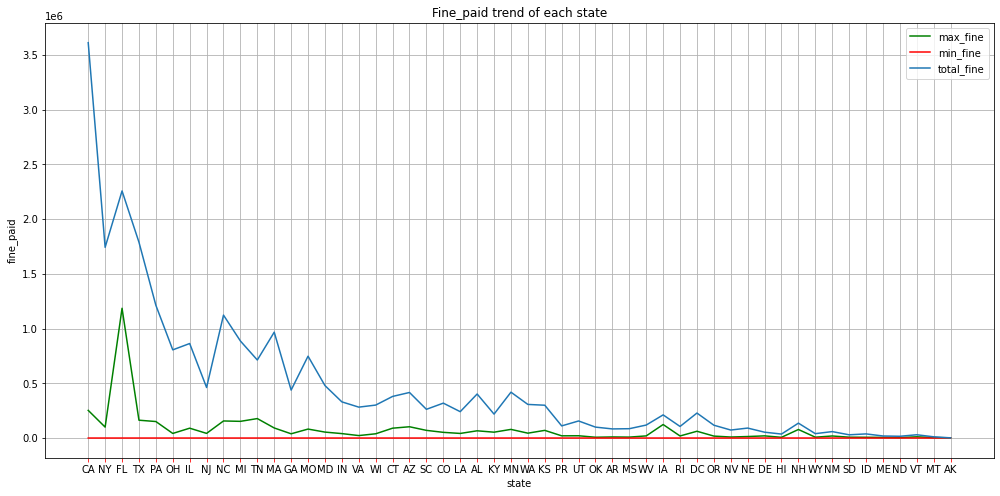

In [128]:

lst1=list(st_df['state'])
lst2=list(st_df['max_fine'])
lst3=list(st_df['min_fine'])
lst4=list(st_df['st_total'])
plt.figure(figsize=(17,8))
plt.plot(lst1,lst2,label='max_fine',color='green')
plt.plot(lst1,lst3,label='min_fine',color='red')
plt.plot(lst1,lst4,label='total_fine')

#plt.xaxis.label.set_color('blue')
#plt.yaxis.label.set_color('blue')
plt.tick_params(axis='x',color='red')
plt.xlabel('state')
plt.ylabel('fine_paid')
plt.title('Fine_paid trend of each state')
plt.grid()
plt.legend()
plt.show()

In [22]:
file_2.columns=file_2.columns.str.strip()
print(list(file_2.columns))
#file_2=pd.concat([file_2['online_fine'].str.split().str[0].str.replace(',','').astype(int) for online_fine in file_2],axis=1)
file_2['online_fine']=pd.to_numeric(file_2['online_fine'],errors='coerce')
file_2['cash_fine']=pd.to_numeric(file_2['cash_fine'],errors='coerce')
print(file_2.dtypes)

['org_indiv', 'first_name', 'last_name', 'city', 'state', 'category', 'cash_fine', 'online_fine', 'total', 'name']
org_indiv       object
first_name      object
last_name       object
city            object
state           object
category        object
cash_fine      float64
online_fine    float64
total            int64
name            object
dtype: object


In [50]:
st_on_flt=file_2['state']=='NJ'
list1=tuple((file_2.loc[st_on_flt,'online_fine']))
sum(list1)#tried with tuple as well but sum function producinng null 
#rectifying null values and replacing them with zero if we find any
bool1=pd.isnull(file_2['online_fine'])

file_2.loc[file_2['online_fine'].isnull()]=0

file_2[bool1]

c:\users\swaro\appdata\local\programs\python\python37\lib\site-packages\pandas\core\indexing.py:1763: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)


,org_indiv,first_name,last_name,city,state,category,cash_fine,online_fine,total,name


## to get the least 2 states that had to pay minimum 'online' fine 

In [24]:

on_paid={'state':[],'online_sum':[]}
for i in state_key:
    st_on_flt=file_2['state']==i
    on_list=list(file_2.loc[st_on_flt,'online_fine'])
    on_arr=np.array(on_list)
    
    on_sum=np.sum(on_arr)
    #print(i,on_sum)     
    on_paid['state'].append(i)
    on_paid['online_sum'].append(on_sum)
    
#dataframe for total online fees paid by each
online_df=pd.DataFrame(on_paid)
online_df=online_df.sort_values(by='online_sum',ascending=True)
two_states=online_df.head(2)
print("the least 2 states that had to pay minimum 'online' fine:")
two_states

the least 2 states that had to pay minimum 'online' fine:


,state,online_sum
51,AK,0.0
48,ND,321.0


In [25]:
online_df[online_df['online_sum']==online_df['online_sum'].min()]

,state,online_sum
51,AK,0.0


## to find the number of doctors that contributed to the state having highest 'cash' fine

In [26]:
#state with highest cash flow
cash_paid={'state':[],'offline_sum':[]}
file_2.loc[file_2['cash_fine'].isnull()]=0
for x in state_key:
    st_cash_flt=file_2['state']==x
    cash_list=list(file_2.loc[st_cash_flt,'cash_fine'])
    cash_arr=np.array(cash_list)
    
    cash_sum=np.sum(cash_arr)
    #print(i,cash_sum)     
    cash_paid['state'].append(x)
    cash_paid['offline_sum'].append(cash_sum)
    
cash_paid=pd.DataFrame(cash_paid) 
#printing state with highest cash fine payment
state_Hi=cash_paid[cash_paid['offline_sum']==cash_paid['offline_sum'].max()]
print("state with highest cash fine is:{}".format(state_Hi))

state with highest cash fine is:  state  offline_sum
0    CA    4331517.0


In [27]:
bool1=pd.isnull(file_2['first_name'])
file_2[bool1]

,org_indiv,first_name,last_name,city,state,category,cash_fine,online_fine,total,name
131,ALBANY MEDICAL COLLEGE,NaN,---,ALBANY,NY,Infosys Sponsored Research initiated before Ju...,6702.0,0.0,6702,NaN
524,BARBARA ANN KARMANOS CANCER CENTER,NaN,---,DETROIT,MI,Infosys Sponsored Research initiated before Ju...,76710.0,0.0,76710,NaN
525,BARBARA ANN KARMANOS CANCER INSTITUTE,NaN,---,DETRIOT,MI,Infosys Sponsored Research initiated before Ju...,80621.0,0.0,80621,NaN
614,BAYLOR COLLEGE OF MEDICINE,NaN,---,HOUSTON,TX,Infosys Sponsored Research initiated before Ju...,116693.0,0.0,116693,NaN
615,BAYLOR RESEARCH INSTITUTE,NaN,---,DALLAS,TX,Infosys Sponsored Research initiated before Ju...,105811.0,0.0,105811,NaN
616,BAYSTATE MEDICAL CENTER,NaN,---,SPRINGFIELD,MA,Infosys Sponsored Research initiated before Ju...,19093.0,0.0,19093,NaN
757,BETH ISRAEL DEACONESS MEDICAL CENTER,NaN,---,BOSTON,MA,Infosys Sponsored Research initiated before Ju...,7543.0,0.0,7543,NaN
758,BETH ISRAEL MEDICAL CENTER,NaN,---,NEW YORK,NY,Infosys Sponsored Research initiated before Ju...,29725.0,0.0,29725,NaN
855,BOARD OF REGENTS OF THE UNIV OF WISCONSIN SYSTEM,NaN,---,MILWAUKEE,WI,Infosys Sponsored Research initiated before Ju...,15682.0,0.0,15682,NaN
856,BOARD OF REGENTS OF THE UNIVERSITY,NaN,---,MADISON,WI,Infosys Sponsored Research initiated before Ju...,2464.0,0.0,2464,NaN


In [28]:

file_2=file_2.dropna(subset=['first_name'])
file_2[bool1]

c:\users\swaro\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


,org_indiv,first_name,last_name,city,state,category,cash_fine,online_fine,total,name


In [29]:

fltr_doc=file_2['state']=='CA'
doc_count=(file_2.loc[fltr_doc,'first_name']).count()
print("total number of doctors contributing to the CA, which is the largest cash fine paying state:",doc_count)
#pd.DataFrame(doc_count,dtype='str')


total number of doctors contributing to the CA, which is the largest cash fine paying state: 1158


## finally

###### Here control flows were used to answer all queries concerning to the data, while manipulating data to get answers for some of the questionaries, mostly same approach is used. However in this common context, we can also get that done by defining ' class ', as we  just need is to change the parameters  we need to pass in.  Could have used this while dealing with "online_fine and cash_fine"  